In [35]:
import sys
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

import ffmpeg

from matplotlib import animation
from IPython.display import HTML

from itertools import combinations

from matplotlib.patches import Ellipse

%matplotlib notebook
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [36]:
class Model:
    def __init__(self, length, radius, viscosity, pressure_difference):
        self.length = length
        self.radius = radius
        self.viscosity = viscosity
        self.pressure_difference = pressure_difference
        
        
class Particle:
    def __init__(self, name, q, q_dot, radius, mass, state=True):
        self.name = name 
        self.state = state # adsorbed -> False, not adsorbed -> True
        self.coordinates = q
        self.velocity = q_dot
        self.radius = radius
        self.mass = mass

        
class Collection_of_Particles:
    def __init__(self, List_of_Particles):
        self.name = np.array([element.name for element in List_of_Particles])
        self.state = np.array([element.state for element in List_of_Particles])
        self.coordinates = np.array([[0., 0.] for element in List_of_Particles])
        self.velocity = np.array([element.velocity for element in List_of_Particles])
        self.radius = np.array([element.radius for element in List_of_Particles])
        self.mass = np.array([element.mass for element in List_of_Particles])
        self.number_of_particles = len(List_of_Particles)
    
    def adsorbed(self, bool_mask):
        self.state[bool_mask] = False
        self.velocity[bool_mask] = np.array([0., 0.])
    
    def update_coordinates(self, Q):
        self.coordinates[self.state] = Q[self.state]
        
    def update_velocity(self, Q_dot):
        self.velocity[self.state] = Q_dot[self.state]
        
    def Van_der_Waals_force(self, i):
        Ri = self.radius[i]
        R = self.radius
        r_ij = self.coordinates - self.coordinates[i]
        modul_r_ij = np.linalg.norm(r_ij, axis=1)
    
        A = 64 # Вообще говоря разная для разных видов частиц
        z = Ri + R + modul_r_ij
        result = np.zeros_like(r_ij)
        for j in range(self.number_of_particles):
            if modul_r_ij[j] == 0:
                continue
            else:
                result[j] = A*64*(Ri*R[j])**(3)*z[j]*r_ij[j]/(6*modul_r_ij[j])
                result[j] /= (z[j]**2 - (Ri+R[j])**2)**2
                result[j] /= (z[j]**2 - (Ri-R[j])**2)**2
        return np.sum(result)
    
    def calculate_acceleration(self, model:Model):
        puazel_velocity = np.array([[1.0, 0.0] for i in range(self.number_of_particles)])*model.pressure_difference
        puazel_velocity *= np.column_stack((model.radius, model.radius))**(2)/(4*model.viscosity*model.length)  
        puazel_velocity *= (1 - (np.column_stack((self.coordinates[:, 1], self.coordinates[:, 1]))/np.column_stack((model.radius, model.radius)) - 1)**2) 
        flow_force = -6*np.pi*model.viscosity*np.column_stack((model.radius, model.radius))*(self.velocity - puazel_velocity)
        vdw_force = np.array([[self.Van_der_Waals_force(i)] for i in range(self.number_of_particles)])
        return (flow_force + vdw_force)/np.column_stack((self.mass, self.mass))
    
    def overlaps(self, i, j):
        return np.hypot(*(self.coordinates[i] - self.coordinates[j])) < (self.radius[i] + self.radius[j])
    
    def collision(self, i, j):
        mi, mj = self.mass[i], self.mass[j]
        M = mi + mj
        ri, rj = self.coordinates[i], self.coordinates[j]
        d = np.linalg.norm(ri - rj)**2
        vi, vj = self.velocity[i], self.velocity[j]
        ui = vi - 2*mj / M * np.dot(vi-vj, ri-rj) / d * (ri - rj)
        uj = vj - 2*mi / M * np.dot(vj-vi, rj-ri) / d * (rj - ri)
        self.velocity[i] = ui
        self.velocity[j] = uj
        
    def handle_collisions(self):
        pairs = combinations(range(self.number_of_particles), 2)
        for i,j in pairs:
            if self.overlaps(i, j):
                self.collision(i, j)
    
    
def get_random_coordinates(particles:Collection_of_Particles, model:Model):
    result = np.zeros_like(particles.coordinates) + np.stack((particles.radius, particles.radius), axis=-1)
    overlaps = lambda i, j : np.hypot(*(result[i] - result[j])) < (particles.radius[i] + particles.radius[j])
    for i in range(particles.number_of_particles):
        overlaps_array = np.array([overlaps(i, j) for j in range(particles.number_of_particles) if j != i])
        while(np.any(overlaps_array)):
            if(particles.name[i] == "vesicle"):
                result[i, 0] = 0
                result[i, 1] = np.random.uniform(particles.radius[i], (2*model.radius - particles.radius[i]))
            else:
                x = np.random.uniform(-model.length, (model.length - particles.radius[i]))
                y = np.random.uniform(particles.radius[i], (2*model.radius - particles.radius[i]))
                result[i] = np.array([x, y])
            
            overlaps_array = np.array([overlaps(i, j) for j in range(particles.number_of_particles) if j != i])
            
    return result


def get_random_velocity(particles:Collection_of_Particles, model:Model):
    puazel_velocity = np.array([[1.0, 0.0] for i in range(particles.number_of_particles)])*model.pressure_difference
    puazel_velocity *= np.column_stack((model.radius, model.radius))**(2)/(4*model.viscosity*model.length)
    puazel_velocity *= (1 - (np.column_stack((particles.coordinates[:, 1], particles.coordinates[:, 1]))/np.column_stack((model.radius, model.radius)) - 1)**2)
    puazel_velocity += 0.1*puazel_velocity*np.array([[np.random.choice([1, -1]), np.random.choice([1, -1])] for i in range(particles.number_of_particles)])
    return puazel_velocity

In [37]:
model = Model(100, 15, 1.2, 16e5)

vesicle = Particle("vesicle", np.array([0., 0.]), np.array([0., 0.]), 90e-3, 27, True)
blood_cell = Particle("blood_cell", np.array([0., 0.]), np.array([0., 0.]), 3.5, 27000, True)

number_of_vesicles = 50
number_of_blood_cells = 40

vesicles_list = [vesicle for i in range(number_of_vesicles)]
blood_cells_list = [blood_cell for i in range(number_of_blood_cells)]

particles = Collection_of_Particles(vesicles_list+blood_cells_list)

particles.update_coordinates(get_random_coordinates(particles, model))
particles.update_velocity(get_random_velocity(particles, model))

<IPython.core.display.Javascript object>


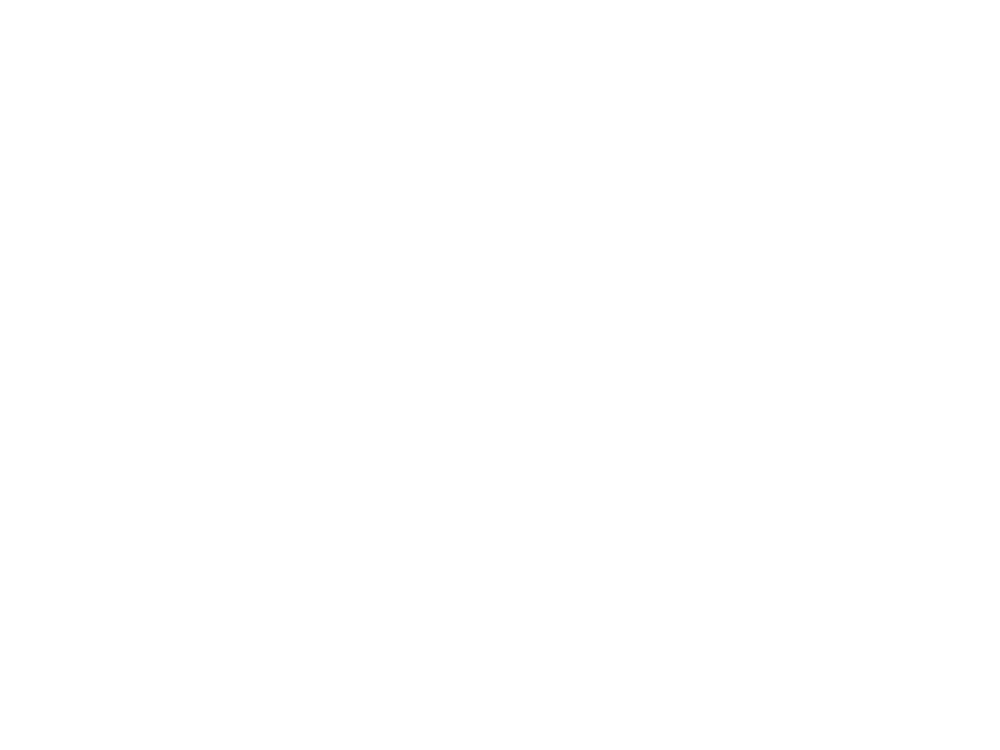

In [38]:
fig, ax = plt.subplots(subplot_kw={'aspect': 'equal'}, dpi=250)
plt.close() 

delta_t = 5e-6
t_max = 1e-3
T = np.arange(0, t_max, delta_t)
time_indexes = np.arange(T.size)

colors = ["blue" if particles.name[i] == "vesicle" else "red" for i in range(particles.number_of_particles)]

coordinates_array = np.array([particles.coordinates for t in time_indexes])

for t in time_indexes[1:]:
    previous_acceleration = particles.calculate_acceleration(model)
    previous_velocity = np.copy(particles.velocity)
    v_hat = previous_velocity + 0.5*delta_t*previous_acceleration
    particles.update_coordinates(particles.coordinates + delta_t*particles.velocity + 0.5*delta_t**(2)*previous_acceleration)
    particles.update_velocity(v_hat)
    acceleration = particles.calculate_acceleration(model)
    particles.update_velocity(previous_velocity + 0.5*delta_t*(previous_acceleration + acceleration))
    
    velocity_before_wall = np.copy(particles.velocity)
    coordinates_before_wall = np.copy(particles.coordinates)
    adsorbed_mask = np.array([False for i in range(particles.number_of_particles)])
    
    for i in range(particles.number_of_particles):
        if(particles.state[i]):
            if((coordinates_before_wall[i, 1] <= particles.radius[i] and velocity_before_wall[i, 1] < 0) or 
               (coordinates_before_wall[i, 1] >= 2*model.radius - particles.radius[i] and velocity_before_wall[i, 1] > 0)):
                if(particles.name[i] == "vesicle"):
                    adsorbed_mask[i] = True
                else:
                    velocity_before_wall[i, 1] = - velocity_before_wall[i, 1]
            
    particles.update_velocity(velocity_before_wall)
    particles.adsorbed(adsorbed_mask)
    
    particles.handle_collisions()
    coordinates_array[t] = particles.coordinates
        
                
def animate(t):
    """
    Функция для рисования кадров.
    """
    ax.clear()
    ax.grid(linestyle="--", linewidth=0.5, color='gray')
    
    ax.set_xlim(0, model.length)
    ax.set_ylim(0, 2*model.radius)
    
    
    ax.xaxis.set_major_locator(matplotlib.ticker.MultipleLocator(10))
    ax.yaxis.set_major_locator(matplotlib.ticker.MultipleLocator(10))
    
    scale_x = 1 # Параметр масштабирования
    ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/scale_x))
    ax.xaxis.set_major_formatter(ticks_x)
    
    scale_y = 1 # Параметр масштабирования
    ticks_y = ticker.FuncFormatter(lambda y, pos: '{0:g}'.format(y/scale_y))
    ax.yaxis.set_major_formatter(ticks_y)
    
    ax.set_xlabel(r"X, $10^{-6}$ m")
    ax.set_ylabel(r"Y, $10^{-6}$ m")
    
    #time = f'{t*delta_t:.3f}'
    #ax.set_title('t = ' + time + "ms")
    
    for i in range(particles.number_of_particles):
        ax.add_artist(Ellipse((coordinates_array[t, i, 0], coordinates_array[t, i, 1]), 
                               2*particles.radius[i], 2*particles.radius[i], 
                               angle=0, alpha=0.5, color=colors[i]))
    return ax

# Создаем объект анимации и отображаем его в HTML-видео
ani = animation.FuncAnimation(fig, animate, frames=T.size, save_count=sys.maxsize)
ani.save('test.gif', writer='pillow')
HTML(ani.to_jshtml())

In [47]:
particles.state[particles.name == "vesicle"]

array([False, False, False, False, False, False, False, False, False,
        True, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False,  True])

In [79]:
stick_list = []
for i in range(particles.number_of_particles):
    if particles.name[i] == 'vesicle':
        if particles.coordinates[i, 0] <= 100:
            if particles.state[i] == False:
                if particles.coordinates[i, 1] > 30:
                    particles.coordinates[i, 1] = 30
                if particles.coordinates[i, 1] < 0:
                    particles.coordinates[i, 1] = 0
                stick_list.append(particles.coordinates[i])
        
Specifity = len(stick_list) / number_of_vesicles
print(Specifity)

stick_arr = np.array(stick_list)

0.52


<IPython.core.display.Javascript object>


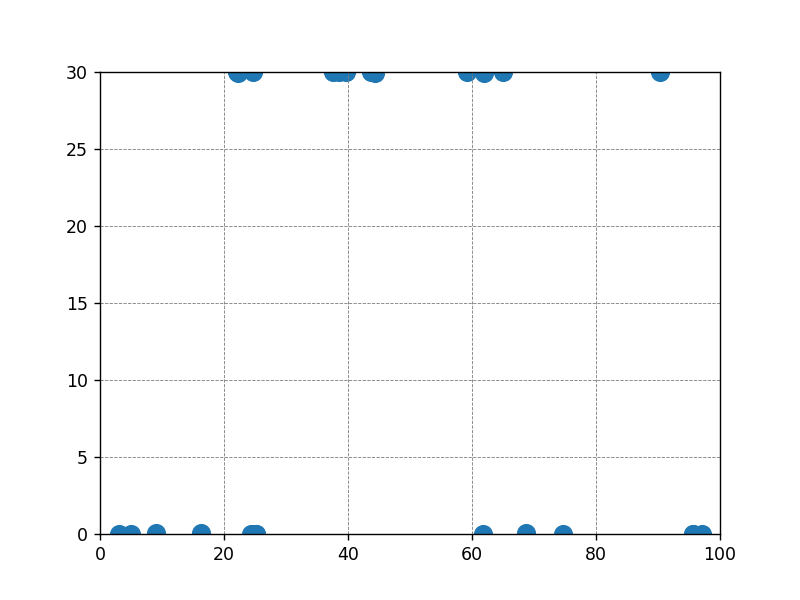

In [80]:
fig, ax = plt.subplots(dpi=100)
ax.set_xlim(0, model.length)
ax.set_ylim(0, 2*model.radius)
plt.scatter(stick_arr[:, 0], stick_arr[:, 1], s=100)
ax.grid(linestyle="--", linewidth=0.5, color='gray')

<IPython.core.display.Javascript object>


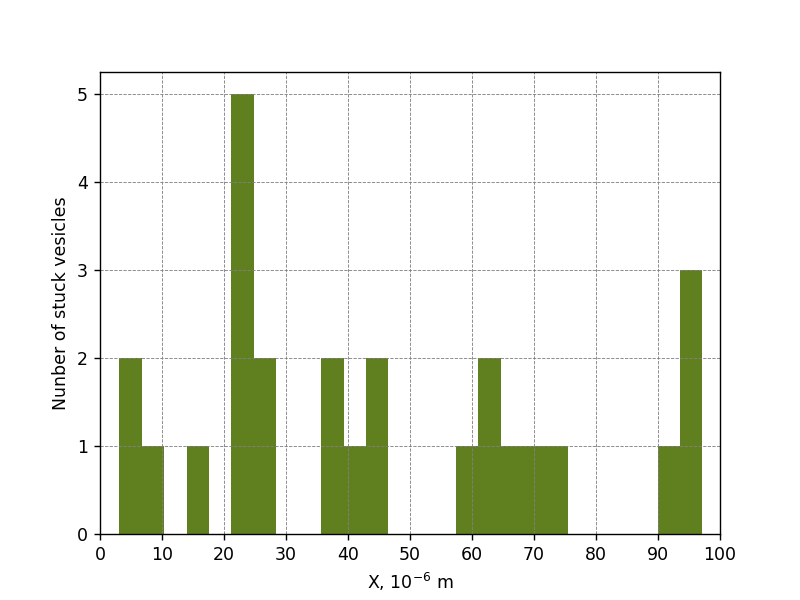

In [98]:
fig, ax = plt.subplots(dpi=100)
ax.grid(linestyle="--", linewidth=0.5, color='gray')

ax.set_xlim(0, model.length)

ax.xaxis.set_major_locator(matplotlib.ticker.MultipleLocator(10))
ax.yaxis.set_major_locator(matplotlib.ticker.MultipleLocator(1))

ax.set_xlabel(r"X, $10^{-6}$ m")
ax.set_ylabel("Nunber of stuck vesicles")

plt.hist(stick_arr[:, 0], bins=stick_arr[:, 0].size, color='#608020')
plt.show()

<IPython.core.display.Javascript object>


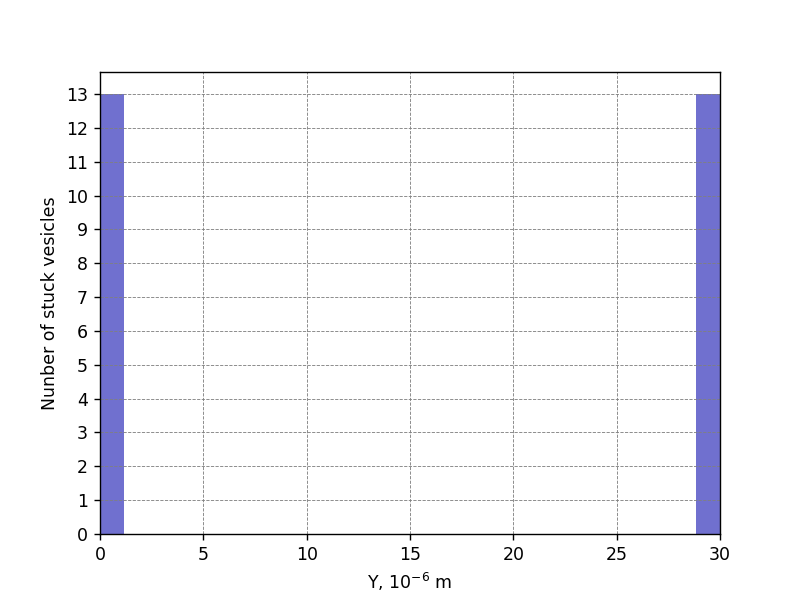

In [99]:
fig, ax = plt.subplots(dpi=100)
ax.grid(linestyle="--", linewidth=0.5, color='gray')

ax.set_xlim(0, 2*model.radius)

ax.xaxis.set_major_locator(matplotlib.ticker.MultipleLocator(5))
ax.yaxis.set_major_locator(matplotlib.ticker.MultipleLocator(1))

ax.set_xlabel(r"Y, $10^{-6}$ m")
ax.set_ylabel("Nunber of stuck vesicles")

plt.hist(stick_arr[:, 1], bins=stick_arr[:, 1].size, color='#7070CF')
plt.show()